#<h1><center>Get the 311: Analysis of the Philadelphia 311 Call Center </center></h1>

**<h4><center>Contributors:** Ben Swanson, Colie Egertson, Ashley Corkery</center></h1>


**Note:** For best results with interactive plots, please open the notebook in Google Colab (the plots should work in Colab even if you don't run the notebook).

# Introduction/Background

###**About Philly 311:**

The Philly 311 service is a non-emergency communication service that connects Philadelphia residents with city services on a 24/7 basis. Residents can report issues such as potholes, graffiti, streetlight outages, among many other issues.

###**Project Introduction:**

In our project, we leverage the Philly 311 dataset, along with census and weather data, to explore patterns and factors influencing the resolution times of 311 service tickets. Understanding these dynamics can offer valuable insights for city planners and policymakers aiming to improve service delivery and resource allocation.

The primary focus of our analysis is on demographic variables derived from census data, segmented by ZIP code. These variables include population density, median income, education levels, and other socioeconomic factors. Additionally, we incorporate weather data to examine its potential impact on service ticket trends and resolution times, acknowledging that weather conditions can affect the accessibility and prioritization of city services.

Our project's objectives are twofold: firstly, to identify trends in 311 tickets associated with demographic and weather factors; and secondly, to build predictive models that estimate ticket resolution times based on these factors. By achieving these goals, we aim to provide actionable insights that could enhance the efficiency of service delivery in Philadelphia, and possibly serve as a resource for residents to set expectations for resolution times of ticket submissions.


###**Goals:**

We are interested in examining three separate groups of data - the 311 dataset, the census dataset, and the weather dataset. We believe each of these groups could influence ticket resolution time for the following reasons:

**311**

The 311 dataset contains several columns that could explain the variation in ticket times. For example, we know the department responsible for the ticket - do some departments resolve their tickets faster than others? This may give the city insight into which departments are efficiently processing 311 tickets and which are not. We can also see if factors related to the request date - for example whether the ticket was placed on the weekend or the season when the ticket was placed - affect the time it takes for the ticket to be resolved.

**Weather**

We are curious whether weather factors could impact ticket resolution time. Many of the services under 311, such as tree removal, road repair, and other services that require work to be done outdoors, could be slowed down by severe weather because work could not be performed. This data could be useful to city officials looking to plan the emergency response for severe weather events in the future, which are likely to become more common due to climate change.

**Census**

The 311 data contains the ZIP code of the request, so we can evaluate demographic factors and see if they influence ticket resolution time. In particular, we're interested in whether there is any correlation between socioeconomic factors and 311 tickets. Do residents of wealthier ZIP codes get their tickets resolved faster than those of poorer ZIP codes? Do they place different types of tickets? This data could help identify any biases in the resolution of tickets and help ensure fair distribution of city resources.

### **Models**

In this notebook we will demonstrate several models that attempt to predict ticket resolution time based on features from these datasets. We will clean the datasets, then perform feature engineering to scale and normalize the data for modeling. We will then create and compare several models using the scikit-learn and Pytorch libraries to see how they perform on the data.

While we hope these models will predict ticket resolution time somewhat accurately, we know that may be difficult given the complex nature of this data and the extent to which it relied on human-entered data. Even if these models are not particularly accurate and thus not useful as predictive models, they can help us identify which features have the largest impact on ticket resolution time.

# Technical Setup

Python package installation and imports:

In [123]:
!pip install tabulate -q
!pip install census -q
!pip install openmeteo-requests -q
!pip install requests-cache retry-requests numpy pandas -q
!pip install dill -q
!pip install -U kaleido -q

In [2]:
# Importing datasets
from tabulate import tabulate
from census import Census
import requests
from datetime import datetime, timedelta
import openmeteo_requests
import requests_cache
from retry_requests import retry

In [124]:
# Plotting & EDA
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
from IPython.display import HTML
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter

In [122]:
# SK learn modeling
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import GradientBoostingRegressor

# NN
import torch
from torch import nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

In [5]:
# warnings
import warnings
warnings.simplefilter('ignore')

# Importing and Wrangling Datasets

In this section, we import the raw source data: 311 request data from OpenDataPhilly, US Census data, and Weather data from OpenMeteo. The 311 data comes from an API that is continuously updated, so we are using a .csv of the data from the start of the dataset in December 2014 up to July 2024. We saved and uploaded the file to Github so it can be downloaded and used every time the notebook is run for consistency. We also have the census and weather data on Github in .csv format to avoid any performance/permission issues with the APIs.

See the text boxes above each `wget` cell to see how the dataset was initially imported.

## Importing 311 Data

Original code for importing 311 data


```python
url = "https://phl.carto.com/api/v2/sql"
query = """
SELECT *
FROM public_cases_fc
"""
response = requests.get(url, params={'q': query})
data = response.json()

df_311 = pd.DataFrame(data['rows'])
```

Run this code to load the 311 data more efficiently - the API is slow

In [6]:
# takes 1 min to run

# get first file
i = 1
filename = f"https://raw.githubusercontent.com/cegertson/cis545-final-proj/main/311/311-{i}.csv"
output = f"311-{i}.csv"
!wget -qc {filename} -O {output}
philly_311_raw_df = pd.read_csv(output)

# remaining files
for i in range(2, 32):
  filename = f"https://raw.githubusercontent.com/cegertson/cis545-final-proj/main/311/311-{i}.csv"
  output = f"311-{i}.csv"
  !wget -qc {filename} -O {output}
  df_311_temp = pd.read_csv(output)
  philly_311_raw_df = pd.concat([philly_311_raw_df, df_311_temp], ignore_index=True)
  !rm {output}

## Importing Census Data

Original code for importing census data

```python
c = Census('e4e40000b241ab0e44217b7408928d88c43c8e80')

zip_codes = [
    '19102', '19103', '19104', '19106', '19107', '19109', '19110', '19111',
    '19112', '19114', '19115', '19116', '19118', '19119', '19120', '19121',
    '19122', '19123', '19124', '19125', '19126', '19127', '19128', '19129',
    '19130', '19131', '19132', '19133', '19134', '19135', '19136', '19137',
    '19138', '19139', '19140', '19141', '19142', '19143', '19144', '19145',
    '19146', '19147', '19148', '19149', '19150', '19151', '19152', '19153',
    '19154'
]

# Fetching data for Philly zip codes
all_data = []
for zip_code in zip_codes:
    zip_code = int(zip_code)
    data = c.acs5.get(
        (
            'B01003_001E', 'B01001_002E', 'B01001_026E', 'B01002_001E', 'B19013_001E',
            'B23025_005E', 'B17001_002E', 'B25002_001E', 'B25002_002E',
            'B25003_002E', 'B25003_003E', 'B25002_003E', 'B25077_001E', 'B15003_017E'
        ),
        {'for': f'zip code tabulation area:{int(zip_code)}'}
    )
    for item in data:
        item['zip_code'] = zip_code
    all_data.extend(data)


census_raw_df = pd.DataFrame(all_data)
```

Run this to pull the census data from Github

In [7]:
!wget https://raw.githubusercontent.com/cegertson/cis545-final-proj/main/census.csv -O census.csv
census_raw_df = pd.read_csv('census.csv')

--2024-08-09 16:59:57--  https://raw.githubusercontent.com/cegertson/cis545-final-proj/main/census.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5816 (5.7K) [text/plain]
Saving to: ‘census.csv’

census.csv          100%[===================>]   5.68K  --.-KB/s    in 0s      

2024-08-09 16:59:58 (61.5 MB/s) - ‘census.csv’ saved [5816/5816]



## Importing Weather Data

Original code for importing weather data

```python
# Setup the Open-Meteo API client with cache and retry on error
cache_session = requests_cache.CachedSession('.cache', expire_after = -1)
retry_session = retry(cache_session, retries = 5, backoff_factor = 0.2)
openmeteo = openmeteo_requests.Client(session = retry_session)

url = "https://archive-api.open-meteo.com/v1/archive"
params = {
	"latitude": 39.9523,
	"longitude": -75.1638,
	"start_date": "2014-01-01",
	"end_date": "2024-07-29",
	"daily": ["temperature_2m_max", "temperature_2m_min", "precipitation_sum", "wind_speed_10m_max"],
	"temperature_unit": "fahrenheit",
	"wind_speed_unit": "mph",
	"precipitation_unit": "inch",
	"timezone": "America/New_York"
}
responses = openmeteo.weather_api(url, params=params)

# Process data for given lat and long
response = responses[0]
print(f"Coordinates {response.Latitude()}°N {response.Longitude()}°E")
print(f"Elevation {response.Elevation()} m asl")
print(f"Timezone {response.Timezone()} {response.TimezoneAbbreviation()}")
print(f"Timezone difference to GMT+0 {response.UtcOffsetSeconds()} s")

# Process daily data. The order of variables needs to be the same as requested.
daily = response.Daily()
daily_temperature_2m_max = daily.Variables(0).ValuesAsNumpy()
daily_temperature_2m_min = daily.Variables(1).ValuesAsNumpy()
daily_precipitation_sum = daily.Variables(2).ValuesAsNumpy()
daily_wind_speed_10m_max = daily.Variables(3).ValuesAsNumpy()

daily_data = {"date": pd.date_range(
	start = pd.to_datetime(daily.Time(), unit = "s", utc = True),
	end = pd.to_datetime(daily.TimeEnd(), unit = "s", utc = True),
	freq = pd.Timedelta(seconds = daily.Interval()),
	inclusive = "left"
)}
daily_data["temperature_2m_max"] = daily_temperature_2m_max
daily_data["temperature_2m_min"] = daily_temperature_2m_min
daily_data["precipitation_sum"] = daily_precipitation_sum
daily_data["wind_speed_10m_max"] = daily_wind_speed_10m_max

weather_raw_df = pd.DataFrame(data = daily_data)
```

Run this code to import the file from Github to avoid API issues

In [8]:
!wget https://raw.githubusercontent.com/cegertson/cis545-final-proj/main/weather.csv -O weather.csv
weather_raw_df = pd.read_csv('weather.csv')

--2024-08-09 16:59:58--  https://raw.githubusercontent.com/cegertson/cis545-final-proj/main/weather.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 249595 (244K) [text/plain]
Saving to: ‘weather.csv’

weather.csv         100%[===================>] 243.75K  --.-KB/s    in 0.02s   

2024-08-09 16:59:58 (10.2 MB/s) - ‘weather.csv’ saved [249595/249595]



# Data Cleaning

In this section, we clean all 3 raw datasets to ensure they contain only data that is useful for our models.

## 311 Cleaning

**ZIP code:**
The ZIP code is necessary to link the 311 data to the census data, which is where we will be able to derive socioeconomic information for our models. Therefore, we must carefully clean the ZIP code field by doing the following:

*   Drop any rows with nulls in the ZIP code field - not all rows in the database have an associated ZIP code, so we can't use them for our models.
*   Validate that all ZIP codes are 5 character strings so we can join the 311 data with the census data.
*   Only include valid ZIP codes in Philadelphia - just in case some bad data snuck in with a ZIP code that is a 5 character string but is not actually a valid ZIP code in the city.



In [9]:
# Drop null zipcodes
print(f"Original length of 311 data: {len(philly_311_raw_df)}")
philly_311_cleaned_df = philly_311_raw_df[philly_311_raw_df['zipcode'].notna()]

# Get length of dataset after dropping null zipcodes
print(f"Rows with non-null ZIP codes: {len(philly_311_cleaned_df)}")

Original length of 311 data: 1877347
Rows with non-null ZIP codes: 667432


In [10]:
# List of valid zip codes for Philadelphia - 48 zip codes in Philadelphia
valid_philadelphia_zip_codes = [
    '19102', '19103', '19104', '19106', '19107', '19109', '19110', '19111', '19112', '19114',
    '19115', '19116', '19118', '19119', '19120', '19121', '19122', '19123', '19124', '19125',
    '19126', '19127', '19128', '19129', '19130', '19131', '19132', '19133', '19134', '19135',
    '19136', '19137', '19138', '19139', '19140', '19141', '19142', '19143', '19144', '19145',
    '19146', '19147', '19148', '19149', '19150', '19151', '19152', '19153'
]

In [11]:
# Cleaning up the zipcode field

# Extract first 5 digits
philly_311_cleaned_df['zipcode'] = philly_311_cleaned_df['zipcode'].astype(str).str[:5]

# Filter to include only those that are in the list of 48 Philly zip codes
philly_311_cleaned_df = philly_311_cleaned_df[philly_311_cleaned_df['zipcode'].isin(valid_philadelphia_zip_codes)]

# Get length of dataset after filtering
print(f"Rows with cleaned ZIP codes: {len(philly_311_cleaned_df)}")

Rows with cleaned ZIP codes: 659456


**Date Fields:**
The date fields in the 311 data are of critical importance to our models. Most importantly, we need to find the difference between the requested date and the closed date for each ticket so we can use these values as the labels for our model. In order to do so, we need to clean up the date fields, then create a new column for days to close, then drop any rows for which we were unable to calculate the days to close.

We clean the date fields by doing the following:
*   Convert datatype to datetime and convert to date (remove time) for all date fields.
*   Add columns for request_weekday, request_month, years_since_311_start, and days_to_close.
*   Drop nulls.



In [12]:
# Convert date fields from object to date
philly_311_cleaned_df['requested_datetime'] = pd.to_datetime(philly_311_cleaned_df['requested_datetime'], errors='coerce')
philly_311_cleaned_df['closed_datetime'] = pd.to_datetime(philly_311_cleaned_df['closed_datetime'], errors='coerce')

# Extract date (removing time) and rename
philly_311_cleaned_df['request_date'] = pd.to_datetime(philly_311_cleaned_df['requested_datetime'].dt.date, errors='coerce')
philly_311_cleaned_df['closed_date'] = pd.to_datetime(philly_311_cleaned_df['closed_datetime'].dt.date, errors='coerce')

# Drop old columns
philly_311_cleaned_df.drop(columns=['requested_datetime', 'closed_datetime'], inplace=True, errors='ignore')

In [13]:
# Add column for request day of the week
philly_311_cleaned_df['request_weekday'] = philly_311_cleaned_df['request_date'].dt.dayofweek

# Add column for request month
philly_311_cleaned_df['request_month'] = philly_311_cleaned_df['request_date'].dt.month

# add years since 311 start
philly_311_cleaned_df['years_since_311_start'] = philly_311_cleaned_df['request_date'].dt.year - 2008



In [14]:
# Add column to get number of days to close
philly_311_cleaned_df['days_to_close'] = (philly_311_cleaned_df['closed_date'] - philly_311_cleaned_df['request_date']).dt.days

# Drop null days_to_close cols
philly_311_cleaned_df = philly_311_cleaned_df.dropna(subset=['days_to_close'])

# row count after dropping null target variable
print(f"Rows with valid target variable: {len(philly_311_cleaned_df)}")

Rows with valid target variable: 653767


**Dropping Unnecessary Columns:**

These columns are not needed after this point in the notebook.

In [15]:
# these are columns that won't be needed for feature engineering
cols_drop = ['Unnamed: 0','cartodb_id', 'the_geom', 'the_geom_webmercator', 'objectid',
             'service_code', 'updated_datetime', 'expected_datetime', 'address',
             'service_notice', 'media_url', 'status_notes', 'status', 'service_request_id', "closed_date"]

philly_311_cleaned_df.drop(columns=cols_drop, inplace=True, errors='ignore')

### Cleaned 311 Dataset

In [16]:
philly_311_cleaned_df.head()

,subject,service_name,agency_responsible,zipcode,lat,lon,request_date,request_weekday,request_month,years_since_311_start,days_to_close
1,Illegal Dumping,Illegal Dumping,Streets Department,19143,39.934388,-75.221705,2022-03-07,0,3,14,130.0
2,Illegal Dumping,Illegal Dumping,Streets Department,19125,39.986230,-75.125071,2021-08-20,4,8,13,4.0
7,Vacant Lot Clean-Up,Maintenance Complaint,Community Life Improvement Program,19133,39.992336,-75.145185,2015-02-13,4,2,7,264.0
10,Traffic Signal Emergency,Traffic Signal Emergency,Streets Department,19144,40.031112,-75.177818,2015-02-13,4,2,7,4.0
13,Illegal Dumping,Illegal Dumping,Streets Department,19140,40.011450,-75.143680,2022-03-07,0,3,14,21.0


## Census Cleaning

The census data requires cleaning to give the columns human-readable names, as well as to make sure it contains the right ZIP codes and does not contain any nulls.


The raw columns come in with non-meaningful names:

In [17]:
# Renaming columns
census_raw_df.rename(columns={
    'B01003_001E': 'Total Population',
    'B01001_002E': 'Male Population',
    'B01001_026E': 'Female Population',
    'B01002_001E': 'Median Age',
    'B19013_001E': 'Median Household Income',
    'B23025_005E': 'Population Unemployed',
    'B17001_002E': 'Population Below Poverty Level',
    'B25002_001E': 'Total Housing Units',
    'B25002_002E': 'Occupied Housing Units',
    'B25002_003E': 'Vacant Housing Units',
    'B25003_002E': 'Owner-Occupied Housing Units',
    'B25003_003E': 'Renter-Occupied Housing Units',
    'B25077_001E': 'Median Home Value',
    'B15003_017E': 'Population with Bachelor\'s Degree'
}, inplace=True)

In [18]:
# Cleaning and reordering to see zip code first
census_raw_df.drop(columns=["zip code tabulation area", "Unnamed: 0"], axis=1, inplace=True)
census_raw_df = census_raw_df[['zip_code'] + [c for c in census_raw_df if c not in ['zip_code']]]

# Null checking
census_nulls = census_raw_df[census_raw_df.isna().any(axis=1)]
print(f"Rows with null values = {len(census_nulls)}") # no rows containing null

# drop rows with invalid data (all data should be greater than 0)
census_cleaned_df = census_raw_df[(census_raw_df > 0).all(axis=1)]
print(f"Number of ZIP codes with invalid values: {len(census_cleaned_df)}") # only two invalid zip codes

Rows with null values = 0
Number of ZIP codes with invalid values: 46


### Cleaned Census Dataset

In [19]:
 # show final dataset
census_cleaned_df.head()

,zip_code,Total Population,Male Population,Female Population,Median Age,Median Household Income,Population Unemployed,Population Below Poverty Level,Total Housing Units,Occupied Housing Units,Owner-Occupied Housing Units,Renter-Occupied Housing Units,Vacant Housing Units,Median Home Value,Population with Bachelor's Degree
0,19102,5635.0,2728.0,2907.0,30.7,108350.0,57.0,961.0,4450.0,3847.0,888.0,2959.0,603.0,419000.0,129.0
1,19103,25705.0,11760.0,13945.0,35.3,93740.0,506.0,2204.0,19482.0,16759.0,5079.0,11680.0,2723.0,537200.0,1096.0
2,19104,53679.0,24632.0,29047.0,22.9,33766.0,1990.0,15794.0,22822.0,18894.0,3594.0,15300.0,3928.0,253000.0,4541.0
3,19106,14012.0,7350.0,6662.0,39.4,128173.0,287.0,653.0,9671.0,8495.0,4057.0,4438.0,1176.0,508300.0,686.0
4,19107,15232.0,7310.0,7922.0,31.1,67690.0,462.0,3044.0,9736.0,8612.0,1593.0,7019.0,1124.0,445500.0,904.0


## Weather Cleaning

We clean the weather data by doing the following:
*   Drop unnecessary columns - the weather data contains many complex observations that we don't expect to be relevant, so we are limiting the weather data to min/max temperature, precipitation, and wind speed.
*   Convert date data type so we can merge the weather data with the 311 request data.
*   Rename columns to give less technical names of what they represent.



Removing Github label column

In [20]:
# remove added column
weather_raw_df.drop("Unnamed: 0", axis=1, inplace=True)

Converting to Datetime

In [21]:
weather_raw_df.dtypes

,0
date,object
temperature_2m_max,float64
temperature_2m_min,float64
precipitation_sum,float64
wind_speed_10m_max,float64


In [22]:
# Datetime format for date field
weather_raw_df['date'] = pd.to_datetime(weather_raw_df['date'], errors='coerce')
weather_raw_df['date'] = pd.to_datetime(weather_raw_df['date'].dt.date, errors='coerce')

In [23]:
# Rename columns
weather_cleaned_df = weather_raw_df.rename(columns={
    'temperature_2m_max': 'day_of_max_temp',
    'temperature_2m_min': 'day_of_min_temp',
    'precipitation_sum': 'day_of_precipitation',
    'wind_speed_10m_max': 'day_of_max_wind_speed',
})

In [24]:
print(f"Row count for weather data: {len(weather_cleaned_df)}")

Row count for weather data: 3863


### Cleaned (and Final) Weather Dataset

In [25]:
weather_cleaned_df.head()

,date,day_of_max_temp,day_of_min_temp,day_of_precipitation,day_of_max_wind_speed
0,2014-01-01,39.0776,24.947600,0.000000,6.909398
1,2014-01-02,36.1976,24.857600,0.185039,10.379777
2,2014-01-03,23.6876,-0.162399,0.338583,15.756167
3,2014-01-04,26.5676,-3.942402,0.000000,8.790015
4,2014-01-05,48.6176,16.757600,0.023622,12.205495


# Feature Engineering

In this section we use our cleaned datasets to create numerical features in order to run models.

## 311 Features
First, we take a random sample of size 100,000 - this is a sufficient number of rows to get a good model.  Then we group the 311 services into broader categories as new field `service_categories`. Finally, we add new columns for season and weekend vs. weekday from the date field and create a "region" field that is more general than ZIP code.


**Random Sample:**

In [26]:
# Make copy of 311_cleaned_df
philly_311_features_df = philly_311_cleaned_df.copy()

# Get random sample with 100,000 instances
philly_311_features_sample_df = philly_311_features_df.sample(n=100000, random_state=42)

# checking sampling
print(len(philly_311_features_sample_df))

100000


### Service Categories

We are interested to see if the service category impacts resolution times - there are many different services under 311, but we could see some obvious groupings which make this data easier to use for this purpose.

Because we will need dummy columns for all categories in each categorical variable, we need to reduce the number of categories to limit the size of our final feature dataset.

We grouped the services by name based on logical umbrella categories that the service names fell under. This process led to a reduction in categories from 72 down to 9.

In [27]:
services = {
     "Information & Directory Services": [
        "Information Request", "Directory Assistance", "KB Escalations", "Eclipse Help"
    ],
    "Traffic & Street Services": [
        "Traffic Signal Emergency", "Street Defect", "Stop Sign Repair", "Street Light Outage",
        "Alley Light Outage", "Manhole Cover", "Inlet Cleaning", "Line Striping",
        "Traffic Calming Request", "Traffic (Other)", "Street Paving", "Other (Streets)",
        "Complaint (Streets)", "Dangerous Sidewalk"
    ],
    "Environmental & Public Health": [
        "Illegal Dumping", "Rubbish/Recyclable Material Collection", "Dead Animal in Street",
        "Hydrant Request", "Hydrant Knocked Down (No Water)", "Sanitation / Dumpster Violation",
        "Dumpster Violation", "Sanitation Violation", "Plastic Bag Complaint",
        "Plastic Bag Notice", "Opioid Response Unit", "Infestation Residential",
        "Vacant Lot Clean-Up", "Abandoned Bike", "Abandoned Vehicle"
    ],
    "Maintenance & Repairs": [
        "Maintenance Complaint", "Maintenance Residential or Commercial", "Building Dangerous",
        "Dangerous Building Complaint", "Building Construction", "Building Force",
        "Fire Residential or Commercial", "Fire Safety Complaint", "Fire_Safety_Complaint",
        "Construction Complaints", "Construction Site Task Force", "Smoke Detector"
    ],
    "Trees & Parks": [
        "Street Trees", "Tree Dangerous", "Parks and Rec Safety and Maintenance", "Graffiti Removal"
    ],
    "Zoning & Licensing": [
        "Right of Way Unit", "Right-of-Way", "Zoning Business", "Zoning Residential",
        "License Complaint", "License Residential", "License_Complaint", "Boarding Room House", "LI Escalation"
    ],
    "Residential & Commercial Issues": [
        "No Heat (Residential)", "No Heat Residential", "Emergency Air Conditioning",
        "Shoveling", "Salting", "Vacant House or Commercial", "Daycare Residential or Commercial",
        "Dangerous Building Complaint"
    ],
    "Safety & Social Issues": [
        "Social Distancing Complaint", "Homeless Encampment Request", "Homeless Encampment",
        "Police Complaint", "Complaints against Fire or EMS", "Newsstand Outdoor Cafe",
        "Newsstand/Outdoor Cafe", "Other Dangerous"
    ],
    "Miscellaneous": [
        "Miscellaneous", "Service Day"
    ]
}

In [28]:
# # Mapping from service_name to service_category
service_name_to_category = {service: category for category, services_list in services.items() for service in services_list}

# # Function to map service_name to service_category
def map_service_to_category(service_name):
    return service_name_to_category.get(service_name, "Unknown")

# # Apply the mapping function to create the service_category column
philly_311_features_sample_df['service_category'] = philly_311_features_sample_df['service_name'].apply(map_service_to_category)

### Season

We also want to see if the season impacts ticket resolution. In order to gauge the effect of the season on resolution time, we created a
feature that specifies the season during which the ticket was placed, thus reducing the 12 month categories to 4 seasons.

In [29]:
# Function to map months to seasons
def season(month):
  if month in [12, 1, 2]:
    return 'winter'
  elif month in [3, 4, 5]:
    return 'spring'
  elif month in [6, 7, 8]:
    return 'summer'
  else:
    return 'fall'

In [30]:
# Add column for season
philly_311_features_sample_df['season'] = philly_311_features_sample_df['request_month'].apply(season)

### Weekend vs Weekday

This feature will allow the model to determine if the ticket was placed during the week or on the weekend, which will help us determine if the 311 service is faster/slower on the weekend.

In [31]:
# weekday boolean
is_weekday = lambda x: 1 if x > 5 else 0
philly_311_features_sample_df['is_weekday'] = philly_311_features_sample_df['request_weekday'].apply(is_weekday)

### Regions

Rather than using the 40+ Philadelphia ZIP codes as categorical values, we used the ZIP code to map each request into one of 7 Regions: N, NW, NE, S, SW, W, CC (Center City). We hope that these regional groupings will better represent the geographic location of the request given that many ZIP codes are small or irregularly shaped.

In [32]:
# Mapping from zipcode to region
zip_to_region = {
    '19143': 'SW',
    '19125': 'NE',
    '19133': 'N',
    '19144': 'NW',
    '19140': 'N',
    '19103': 'CC',
    '19107': 'CC',
    '19152': 'NE',
    '19119': 'NW',
    '19147': 'S',
    '19131': 'W',
    '19146': 'S',
    '19128': 'NW',
    '19114': 'NE',
    '19137': 'NE',
    '19145': 'S',
    '19148': 'S',
    '19135': 'NE',
    '19118': 'NW',
    '19139': 'W',
    '19124': 'NE',
    '19126': 'N',
    '19104': 'W',
    '19121': 'N',
    '19120': 'N',
    '19150': 'NW',
    '19149': 'NE',
    '19151': 'W',
    '19116': 'NE',
    '19132': 'N',
    '19134': 'NE',
    '19129': 'N',
    '19111': 'NE',
    '19141': 'N',
    '19136': 'NE',
    '19142': 'SW',
    '19115': 'NE',
    '19153': 'SW',
    '19122': 'N',
    '19130': 'CC',
    '19102': 'CC',
    '19127': 'NW',
    '19138': 'N',
    '19123': 'N',
    '19106': 'CC',
    '19109': 'CC',
    '19112': 'S',
    '19110': 'CC'
}

In [33]:
# Adding region to dataframe
philly_311_features_sample_df['region'] = philly_311_features_sample_df['zipcode'].map(zip_to_region)

We need some of the columns used in feature engineering for EDA, so we're making a copy here before dropping excess columns from the feature dataset.

In [34]:
# Making copy for EDA before dropping columns
philly_311_eda_sample_df = philly_311_features_sample_df.copy()

### Dropping Columns
These columns are no longer needed after this point in the notebook and will not work with the models, so we drop them.

In [35]:
# List of columns to drop
cols_to_drop = ['subject', 'service_name', 'agency_responsible', 'request_weekday',
                'lat', 'lon']

# Dropping
philly_311_features_sample_df.drop(columns=cols_to_drop, inplace=True, errors='ignore')

### Final 311 Feature Dataset


In [36]:
philly_311_final_df = philly_311_features_sample_df.copy()
philly_311_final_df.head()

,zipcode,request_date,request_month,years_since_311_start,days_to_close,service_category,season,is_weekday,region
1325014,19134,2019-02-13,2,11,1286.0,Maintenance & Repairs,winter,0,NE
774081,19123,2015-07-13,7,7,0.0,Traffic & Street Services,summer,0,N
443323,19143,2020-01-13,1,12,79.0,Environmental & Public Health,winter,0,SW
490381,19145,2022-02-07,2,14,2.0,Environmental & Public Health,winter,0,S
1632234,19120,2019-07-10,7,11,16.0,Residential & Commercial Issues,summer,0,N


## Census Features

We need to make a few changes to the census data for our models
* Normalize Row Counts from Census Data - the data comes in as raw counts, but we want to use per-capita data.
* Cluster ZIP codes by Socio-Economic Data - we created clusters of ZIP codes that have similar socioeconomic factors so that we can evaluate whether these factors influence ticket resolution time.


Copy cleaned data set to create the feature dataset:

In [37]:
census_features_df = census_cleaned_df.copy()

In [38]:
census_features_df.head()

,zip_code,Total Population,Male Population,Female Population,Median Age,Median Household Income,Population Unemployed,Population Below Poverty Level,Total Housing Units,Occupied Housing Units,Owner-Occupied Housing Units,Renter-Occupied Housing Units,Vacant Housing Units,Median Home Value,Population with Bachelor's Degree
0,19102,5635.0,2728.0,2907.0,30.7,108350.0,57.0,961.0,4450.0,3847.0,888.0,2959.0,603.0,419000.0,129.0
1,19103,25705.0,11760.0,13945.0,35.3,93740.0,506.0,2204.0,19482.0,16759.0,5079.0,11680.0,2723.0,537200.0,1096.0
2,19104,53679.0,24632.0,29047.0,22.9,33766.0,1990.0,15794.0,22822.0,18894.0,3594.0,15300.0,3928.0,253000.0,4541.0
3,19106,14012.0,7350.0,6662.0,39.4,128173.0,287.0,653.0,9671.0,8495.0,4057.0,4438.0,1176.0,508300.0,686.0
4,19107,15232.0,7310.0,7922.0,31.1,67690.0,462.0,3044.0,9736.0,8612.0,1593.0,7019.0,1124.0,445500.0,904.0


#### Normalizing Raw Counts from Census Data

The census data contains raw counts for each column, so we need to normalize these values by dividing the counts by the total population of each ZIP code.

In [39]:
# population data
remove_cols = []
for column in census_features_df.columns:
    if "Population" in column.split() and column != "Total Population":
        name = f"{column} Rate"
        remove_cols.append(column)
        census_features_df[name] = census_features_df[column] / census_features_df["Total Population"] * 100

# housing data
for column in census_features_df.columns:
    if "Housing" in column.split() and column != "Total Housing Units":
        remove_cols.append(column)
        name = f"{column} Rate"
        census_features_df[name] = census_features_df[column] / census_features_df["Total Housing Units"] * 100

# remove all raw counts rows
census_features_df.drop(columns=remove_cols, inplace=True)

#### Removing Redundant and Highly Correlated Features
Based on the Census EDA, we remove features that increase model complexity without providing novel information. These features will not help with our models and may lead to overfitting, so it's important that we remove them from the features dataset before modeling.

In [40]:
# remove redundant features as shown in EDA
cols_to_remove = []
# cols with high overall correlation to other columns
cols_to_remove.append('Total Housing Units')
cols_to_remove.append('Male Population Rate')
cols_to_remove.append('Female Population Rate')
cols_to_remove.append('Population Below Poverty Level Rate')
cols_to_remove.append('Population with Bachelor\'s Degree Rate')

# cols with redundant information
cols_to_remove.append('Occupied Housing Units Rate')
cols_to_remove.append('Owner-Occupied Housing Units Rate')

# remove cols, set zip code as index
census_final_df = census_features_df.drop(columns=cols_to_remove)

### Final Census Feature Dataset

In [41]:
census_final_df.head()

,zip_code,Total Population,Median Age,Median Household Income,Median Home Value,Population Unemployed Rate,Renter-Occupied Housing Units Rate,Vacant Housing Units Rate
0,19102,5635.0,30.7,108350.0,419000.0,1.011535,66.494382,13.550562
1,19103,25705.0,35.3,93740.0,537200.0,1.968489,59.952777,13.977004
2,19104,53679.0,22.9,33766.0,253000.0,3.707223,67.040575,17.211463
3,19106,14012.0,39.4,128173.0,508300.0,2.048244,45.889774,12.160066
4,19107,15232.0,31.1,67690.0,445500.0,3.033088,72.093262,11.544782


# Merging Datasets
In this section we merge the feature datasets to create our final set of features for modeling.

Run this cell to load the final dataset directly from a .csv on Github without running any prior cells.

In [42]:
# !wget https://raw.githubusercontent.com/cegertson/cis545-final-proj/main/merged_final.csv -O merged_final.csv
# merged_final_df = pd.read_csv('merged_final.csv')
# merged_final_df.drop(columns=['Unnamed: 0'], inplace=True)

## Merging Datasets for Models

Here we merge the 311 data with the census data based on ZIP code.

In [43]:
# Ensuring zipcode fields are of same type
census_final_df['zip_code'] = census_final_df['zip_code'].astype(str)
philly_311_final_df['zipcode'] = philly_311_final_df['zipcode'].astype(str)

# Merging philly_311_final_df with census_final_df
census_311_merged_df = pd.merge(philly_311_final_df, census_final_df, left_on='zipcode', right_on='zip_code', how='left')

Here we merge the weather data with the combined census and 311 data from the previous step based on the date of the 311 request.

In [44]:
# Merging census_311_merged_df with weather_final_df
merged_final_df = pd.merge(census_311_merged_df, weather_cleaned_df, left_on='request_date', right_on='date', how='left')

In [45]:
# Dropping columns needed for merge, but not needed in final dataset
merged_final_df.drop(columns=['date', 'zip_code', 'zipcode', 'request_date', 'request_month'], inplace=True)

### Final Merged Dataset for Modeling (pre-dummies)

See modeling section for use of this dataset

In [46]:
merged_final_df.head()

,years_since_311_start,days_to_close,service_category,season,is_weekday,region,Total Population,Median Age,Median Household Income,Median Home Value,Population Unemployed Rate,Renter-Occupied Housing Units Rate,Vacant Housing Units Rate,day_of_max_temp,day_of_min_temp,day_of_precipitation,day_of_max_wind_speed
0,11,1286.0,Maintenance & Repairs,winter,0,NE,60229.0,31.6,39412.0,116500.0,1.647047,40.551763,11.801813,41.598500,31.788500,0.118110,18.141780
1,7,0.0,Traffic & Street Services,summer,0,N,18474.0,33.3,91092.0,491000.0,2.711919,62.650484,6.571936,85.787600,68.507600,0.000000,8.605910
2,12,79.0,Environmental & Public Health,winter,0,SW,63186.0,33.1,41764.0,135300.0,5.192606,45.059581,13.665056,49.968500,37.188500,0.000000,8.105846
3,14,2.0,Environmental & Public Health,winter,0,S,44107.0,38.4,68185.0,266100.0,4.913052,37.303855,9.855263,40.068497,29.088501,0.137795,7.436132
4,11,16.0,Residential & Commercial Issues,summer,0,N,71360.0,34.2,46505.0,133200.0,4.680493,33.136688,5.174475,88.578500,69.678500,0.000000,8.712820


## Merging Datasets for EDA

There are columns that we don't need for modeling but make for interesting EDA.
To do this, we again merge the 311 and census data based on ZIP code, then add the weather based on date.

In [47]:
# Handling zipcode datatype for philly_311
philly_311_eda_sample_df['zipcode'] = philly_311_final_df['zipcode'].astype(str)

# Merging philly_311_eda_sample with census_final_df
census_311_eda_merged_df = pd.merge(philly_311_eda_sample_df, census_final_df, left_on='zipcode', right_on='zip_code', how='left')

In [48]:
# Merging census_311_eda_merged_df with weather_cleaned_df
eda_merged_df = pd.merge(census_311_eda_merged_df, weather_cleaned_df, left_on='request_date', right_on='date', how='left')

In [49]:
eda_merged_df.dropna(inplace=True)

### Final Merged Dataset for EDA

In [50]:
eda_merged_df.head()

,subject,service_name,agency_responsible,zipcode,lat,lon,request_date,request_weekday,request_month,years_since_311_start,...,Median Household Income,Median Home Value,Population Unemployed Rate,Renter-Occupied Housing Units Rate,Vacant Housing Units Rate,date,day_of_max_temp,day_of_min_temp,day_of_precipitation,day_of_max_wind_speed
0,Maintenance Residential or Commercial,Maintenance Residential or Commercial,License & Inspections,19134,39.996930,-75.106199,2019-02-13,2,2,11,...,39412.0,116500.0,1.647047,40.551763,11.801813,2019-02-13,41.598500,31.788500,0.118110,18.141780
1,Inlet Cleaning,Inlet Cleaning,Water Department (PWD),19123,39.965643,-75.140391,2015-07-13,0,7,7,...,91092.0,491000.0,2.711919,62.650484,6.571936,2015-07-13,85.787600,68.507600,0.000000,8.605910
2,Abandoned Vehicle,Abandoned Vehicle,Police Department,19143,39.957159,-75.247871,2020-01-13,0,1,12,...,41764.0,135300.0,5.192606,45.059581,13.665056,2020-01-13,49.968500,37.188500,0.000000,8.105846
3,Sanitation / Dumpster Violation,Sanitation / Dumpster Violation,Streets Department,19145,39.914522,-75.174845,2022-02-07,0,2,14,...,68185.0,266100.0,4.913052,37.303855,9.855263,2022-02-07,40.068497,29.088501,0.137795,7.436132
4,Vacant House or Commercial,Vacant House or Commercial,License & Inspections,19120,40.024571,-75.133151,2019-07-10,2,7,11,...,46505.0,133200.0,4.680493,33.136688,5.174475,2019-07-10,88.578500,69.678500,0.000000,8.712820


# EDA
In this section we explore the datasets in order to better understand it before modeling.

**Note:** Many of the visualizations are interactive. Hover over the visualization for more information.

## 311 EDA

In this section we explore the Philly 311 Dataset.

### Overview of 311 Dataset

In [51]:
# Dropping na from philly_311_eda_df
philly_311_eda_sample_df.dropna(inplace=True)

### Summary Statistics Table for 311 Dataset

In [52]:
summary_stats = philly_311_eda_sample_df.describe()
summary_stats

,lat,lon,request_date,request_weekday,request_month,years_since_311_start,days_to_close,is_weekday
count,99632.000000,99632.000000,99632,99632.000000,99632.000000,99632.000000,99632.000000,99632.000000
mean,39.988734,-75.153647,2018-11-13 18:11:38.088967424,2.188554,6.544986,10.374107,100.245473,0.039726
min,39.875310,-75.274312,2014-12-08 00:00:00,0.000000,1.000000,6.000000,0.000000,0.000000
25%,39.951563,-75.183198,2016-09-07 00:00:00,1.000000,4.000000,8.000000,2.000000,0.000000
50%,39.984335,-75.160909,2019-02-04 12:00:00,2.000000,7.000000,11.000000,8.000000,0.000000
75%,40.026081,-75.125227,2020-01-11 00:00:00,3.000000,9.000000,12.000000,63.000000,0.000000
max,40.135781,-74.980607,2024-07-29 00:00:00,6.000000,12.000000,16.000000,2831.000000,1.000000
std,0.045781,0.055733,NaN,1.642588,3.267396,2.329402,272.568083,0.195316


### General Distributions for 311 Dataset

In this section we take a bird's eye view of the Philly 311 dataset, looking at histograms for disributions of `service_name`, `service_category`, and `days_to_close`.



#### Distribution of Tickets per Service Name

The most requested ticket types in the dataset are: Rubbish/Recycleable Material Collection, Illegal Dumping, Maintenance, Abandoned Vehicle, Graffiti Removal, Deficit, Information Request, and Street Light Outage. This gives us a sense of the primary needs of Philadelphia residents and how they are utilizing the 311 service.

In [127]:
service_name_counts = philly_311_eda_sample_df['service_name'].value_counts().reset_index()
service_name_counts.columns = ['service_name', 'count']

# Create bar chart (plotly)
fig = px.bar(
    service_name_counts,
    x='service_name',
    y='count',
    title='Counts of Each Service Name',
    labels={'service_name': 'Service Name', 'count': 'Count'},
    color='service_name',  # Add color to differentiate bars
    color_discrete_sequence=px.colors.qualitative.Plotly
)

# Adjust formatting for readability
fig.update_layout(

    xaxis_title='Service Name',
    yaxis_title='Count of Tickets',
    xaxis_tickangle=-45,  # Rotate x-axis labels
    showlegend=False,
    title_x=0.5
    # template='plotly_white'
)

#fig.show()
HTML(fig.to_html())


#### Distribution of Tickets per Service Category

In the feature engineering section, we grouped together the services into categories based on the general type of services that are offered by 311. Similar to what we observed in the visual above, we can see that the primary categories of tickets requested by residents are related to Environmental & Public Health issues, as well as Maintenance & Repair issues. Again, this gives us a better understanding of how residents are using the service and insight into the needs of the community.

In [54]:
service_category_counts = philly_311_eda_sample_df['service_category'].value_counts().reset_index()
service_category_counts.columns = ['service_category', 'count']

# Create bar chart (plotly)
fig = px.bar(
    service_category_counts,
    x='service_category',
    y='count',
    title='Counts of Each Service Category',
    labels={'service_category': 'Service Category', 'count': 'Count'},
    color='service_category',  # Add color to differentiate bars
    color_discrete_sequence=px.colors.qualitative.Plotly
)

# Adjust formatting for readability
fig.update_layout(
    xaxis_title='Service Category',
    yaxis_title='Count of Tickets',
    xaxis_tickangle=-45,  # Rotate x-axis labels
    showlegend=False,
    title_x=0.5
    # template='plotly_white'
)

fig.show()

### Exploring Resolution Time

In this section we seek to better understand resolution time (`days_to_close`) in more detail.

#### Average Resolution Time per Service Name

Average resolution time varies based on the type of ticket. This is not surprising, as certain requests will inherently take longer to resolve (e.g., Information Requests are typically resolved immediately, whereas tickets that require additional attention and labor will take longer to resolve).

In [55]:
# Getting average days to closer per service name
avg_days_to_close_service_name = eda_merged_df.groupby('service_name')['days_to_close'].mean().reset_index()

# Adding volumns for coloring
ticket_volume = eda_merged_df['service_name'].value_counts().reset_index()
ticket_volume.columns = ['service_name', 'volume']

# Merging together
avg_days_to_close_service_name = avg_days_to_close_service_name.merge(ticket_volume, on='service_name')

fig_service_name = px.bar(
    avg_days_to_close_service_name,
    x='service_name',
    y='days_to_close',
    title='Average Days to Close per Service Name',
    labels={'days_to_close': 'Average Days to Close', 'volume': 'Ticket Counts', 'service_name': 'Service Name'},
    color='volume',
    color_continuous_scale='Viridis'

)

# Adjust formatting for readability
fig_service_name.update_layout(
  title_x=0.5
)

fig_service_name.show()

#### Average Resolution Time per Service Category

Here we can see that certain categories of tickets take longer to reach a resolution than others. It is important to note that different services are handled by different agencies. This may be a contributing factor to resolution time.

Again, we see that tickets requiring additional work and attention generally take longer to resolve.

In [56]:
# Getting avg days to close per service category
avg_days_to_close_service_category = eda_merged_df.groupby('service_category')['days_to_close'].mean().reset_index()

# Getting volumes
ticket_volume_category = eda_merged_df['service_category'].value_counts().reset_index()
ticket_volume_category.columns = ['service_category', 'volume']

# Merging together
avg_days_to_close_service_category = avg_days_to_close_service_category.merge(ticket_volume_category, on='service_category')

fig_service_category = px.bar(
    avg_days_to_close_service_category,
    x='service_category',
    y='days_to_close',
    title='Average Days to Close per Service Category',
    labels={'days_to_close': 'Average Days to Close', 'volume': 'Ticket Counts', 'service_category': 'Service Category'},
    color='volume',
    color_continuous_scale='Viridis'
)

# Adjust formatting for readability
fig_service_category.update_layout(
  title_x=0.5,
  xaxis_tickangle=-45
)

fig_service_category.show()

### Box Plots for Resolution Time by Service Category

Based on the following plots, we see the presence of outliers in `days_to_close`. Due to the accuracy of the model despite the presence of outliers, and the marginal benefit provided by removing outliers, we chose to leave them in our dataset for the sake of this analysis. However, this is a factor that could be further explored in future analyses.

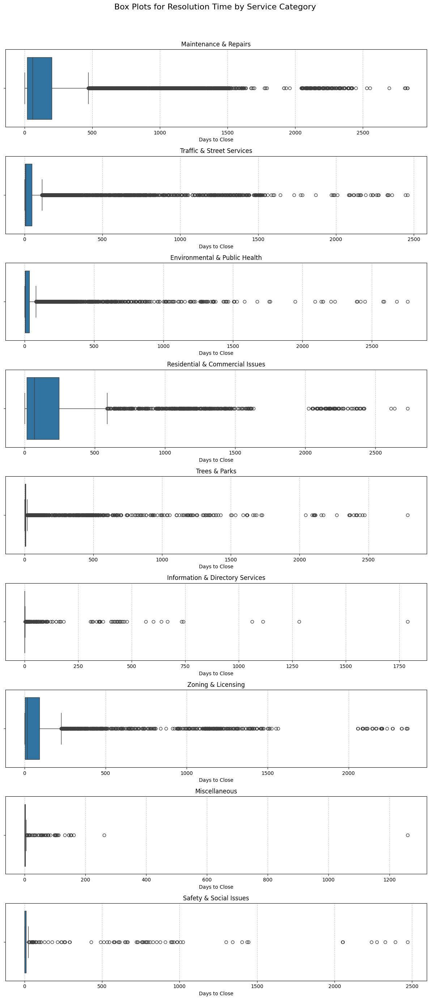

In [57]:
service_categories = eda_merged_df['service_category'].unique()

# Determine the number of rows needed (one plot per row)
n_rows = len(service_categories)

# Set up the figure size
plt.figure(figsize=(12, n_rows * 3))
plt.suptitle('Box Plots for Resolution Time by Service Category', fontsize=16, y=1.02)


# Create a subplot for each service category
for i, category in enumerate(service_categories):
    plt.subplot(n_rows, 1, i + 1)
    sns.boxplot(
        data=eda_merged_df[eda_merged_df['service_category'] == category],
        x='days_to_close',
        showfliers=True  # Show outliers
    )
    plt.title(category)
    plt.xlabel('Days to Close')
    plt.ylabel('')
    plt.grid(axis='x', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

### Trends Over Time

In this section we examine the ticket trends over time to identify any potential trends.

#### Ticket Volume Trends

The top subplot shows the overall trends for all service categories and we break this down to compare the trends per service category in the subplot below.

We see a notable spike in ticket volume in 2018. Referring to the bottom subplot we can see that this spike was not largely attributed to any one specific service category. We also see a drop in ticket volume in 2020, which may be explained by the COVID-19 protocols, in which fewer residents were out in public spaces and as such may not have been reporting as many issues.

In [58]:
# Aggregate by month for total ticket volume
monthly_total_agg = philly_311_eda_sample_df.resample('M', on='request_date').size().reset_index(name='ticket_volume')

# Aggregate by month and service category
monthly_category_agg = philly_311_eda_sample_df.groupby(
    [pd.Grouper(key='request_date', freq='M'), 'service_category']
).size().reset_index(name='ticket_volume')

# Create subplots
fig = make_subplots(rows=2, cols=1, subplot_titles=('Yearly Trends for Total Ticket Volume', 'Yearly Trends for Ticket Volume by Service Category'))

# Plot total ticket volume
fig.add_trace(
    go.Scatter(
        x=monthly_total_agg['request_date'],
        y=monthly_total_agg['ticket_volume'],
        mode='lines+markers',
        name='Total Tickets'
    ),
    row=1,
    col=1
)

# Plot ticket volume by service category
for category in monthly_category_agg['service_category'].unique():
    category_data = monthly_category_agg[monthly_category_agg['service_category'] == category]
    fig.add_trace(
        go.Scatter(
            x=category_data['request_date'],
            y=category_data['ticket_volume'],
            mode='lines+markers',
            name=category
        ),
        row=2,
        col=1
    )

# Fix layout
fig.update_layout(
    title='',
    xaxis_title='Year',
    yaxis_title='Ticket Volume',
    height=1000,
    hovermode='x unified',
    legend_title='Service Category',
    legend=dict(
        orientation='h',
        yanchor='bottom',
        y= 1.09, # move legend to bottom
        xanchor='center',
        x=0.5
    )
)

fig.update_xaxes(title_text='Year', row=1, col=1)
fig.update_xaxes(title_text='Year', row=2, col=1)
fig.update_yaxes(title_text='Ticket Volume', row=1, col=1)
fig.update_yaxes(title_text='Ticket Volume', row=2, col=1)

fig.show()


**Note:**

There are several periods of time in which the overall ticket volume was extremely low (late 2017 to early 2018, 2023 to present). We are unsure why there is significantly less data during these time periods, but feel there is ample data in the other time periods to move forward with our models.

#### Resolution Time Trends
Here we look at trends of average days to close over time.

We can see a spike in resolution time in December 2021. Referencing the bottom subplot, we also see a spike in Maintenance Tickets, which take longer to resolve on average, helping to explain the spike.

In [59]:
# Aggregate by month for avg days_to_close
monthly_avg_agg = philly_311_eda_sample_df.resample('M', on='request_date')['days_to_close'].mean().reset_index(name='average_days_to_close')

# Aggreate by month and service category
monthly_category_avg_agg = philly_311_eda_sample_df.groupby(
    [pd.Grouper(key='request_date', freq='M'), 'service_category']
)['days_to_close'].mean().reset_index(name='average_days_to_close')

# Subplots
fig = make_subplots(rows=2, cols=1, subplot_titles=('Average Days to Close', 'Average Days to Close by Service Category'))

# Plot avg days_to_close (overall)
fig.add_trace(
    go.Scatter(
        x=monthly_avg_agg['request_date'],
        y=monthly_avg_agg['average_days_to_close'],
        mode='lines+markers',
        name='Average Days to Close'
    ),
    row=1,
    col=1
)

# Plot avg days_to_close by service_category
for category in monthly_category_avg_agg['service_category'].unique():
    category_data = monthly_category_avg_agg[monthly_category_avg_agg['service_category'] == category]
    fig.add_trace(
        go.Scatter(
            x=category_data['request_date'],
            y=category_data['average_days_to_close'],
            mode='lines+markers',
            name=category
        ),
        row=2,
        col=1
    )

# Fix layout
fig.update_layout(
    title='',
    title_y=0.95,  # Adjust main title position
    xaxis_title='Date',
    yaxis_title='Average Days to Close',
    height=800,  # Increase the height for more space per subplot
    hovermode='x unified',
    legend_title='Service Category',
    legend=dict(
        orientation='h',
        yanchor='bottom',
        y=1.08,  # Increase y to move the legend further up
        xanchor='center',
        x=0.5
    )
)

fig.update_xaxes(title_text='Year', row=1, col=1)
fig.update_xaxes(title_text='Year', row=2, col=1)
fig.update_yaxes(title_text='Average Days to Close', row=1, col=1)
fig.update_yaxes(title_text='Average Days to Close', row=2, col=1)

fig.show()

## Census EDA

To get a better idea of the Census data, we look at the correlation between features and the distribution of economic data via clustering

In [60]:
census_eda_df = census_cleaned_df.copy()
census_eda_df.set_index('zip_code', inplace=True)

### Scaling Census Data

We first scale the data to remove differing units in the heatmap. Additionally, since PCA is not scale-invariant, the data must be scaled before using it.

In [61]:
scaler = StandardScaler()
scaled_census_data = scaler.fit_transform(census_eda_df.values)
scaled_census_eda_df = pd.DataFrame(scaled_census_data,
                                  index=census_eda_df.index,
                                  columns=census_eda_df.columns)
scaled_census_eda_df.head()

,Total Population,Male Population,Female Population,Median Age,Median Household Income,Population Unemployed,Population Below Poverty Level,Total Housing Units,Occupied Housing Units,Owner-Occupied Housing Units,Renter-Occupied Housing Units,Vacant Housing Units,Median Home Value,Population with Bachelor's Degree
zip_code,,,,,,,,,,,,,,
19102,-1.696878,-1.683800,-1.695333,-1.083165,1.714400,-1.490967,-1.071236,-1.651008,-1.705665,-1.736350,-1.129427,-0.864742,1.146633,-1.476532
19103,-0.522771,-0.576413,-0.470083,-0.097792,1.135858,-1.032027,-0.872127,0.519726,0.395496,-0.632543,1.403331,1.062220,2.005304,-1.243317
19104,1.113724,1.001785,1.206283,-2.754013,-1.239052,0.484827,1.304778,1.002047,0.742923,-1.023656,2.454653,2.157497,-0.059285,-0.412475
19106,-1.206819,-1.117110,-1.278517,0.780475,2.499371,-1.255875,-1.120573,-0.897056,-0.949299,-0.901713,-0.699895,-0.343917,1.795358,-1.342198
19107,-1.135448,-1.122014,-1.138653,-0.997480,0.104305,-1.077001,-0.737572,-0.887670,-0.930260,-1.550670,0.049681,-0.391182,1.339144,-1.289622


### Census Feature Correlation Heatmap

<Axes: >

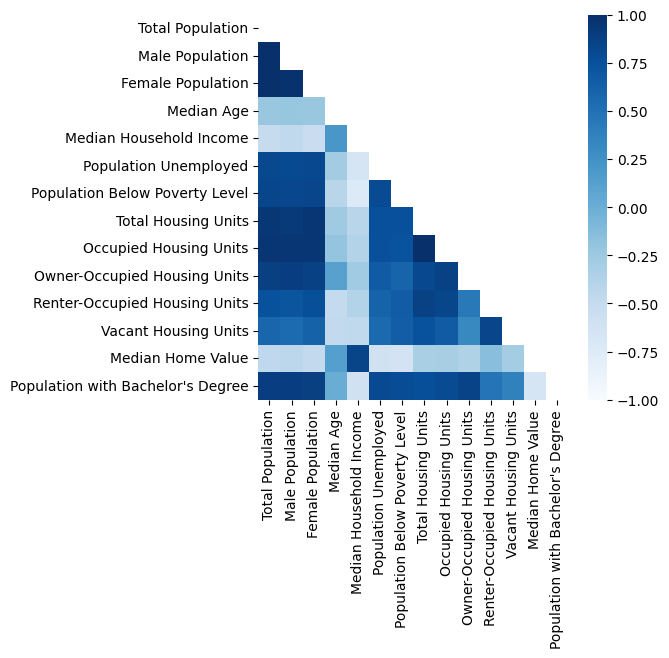

In [62]:
# finding correlation patterns
fig = plt.figure(figsize=(5, 5))
corr = scaled_census_eda_df.corr()
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
corr[mask] = np.nan
max = np.max(corr)
sns.heatmap(corr, cmap="Blues", vmax = 1, vmin = -1, mask=mask)

### Visualizing Economic Data by ZIP Code

We want to understand the geographic distribution of socioeconomic features within Philadelphia. The census data is ordered by each of the 48 ZIP code, and to summarize the ZIP codes we group them into 3 clusters.

We do this by applying PCA dimensionality reduction to the data, and then using this mapped data in K-means clustering.

#### Scaling and PCA

Using the first two principal components, we map the original data into a new dataset.

In [63]:
# Dimensionality reduction
pca = PCA(n_components=2)
census_reduced = pca.fit_transform(scaled_census_eda_df)

#### K-Means Clustering

Finally, we use this dataset to perform kmeans to see the clusters of socio-economic factors.

As we can see, clusters are spread out fairly evenly, and the cluster assignments that Kmeans chooses are not very strong. This reflects the idea that metrics vary widely across ZIP codes, and to obtain more accurate clusters we need to use more specific features. In the 311 & Census section, we break these features down further.

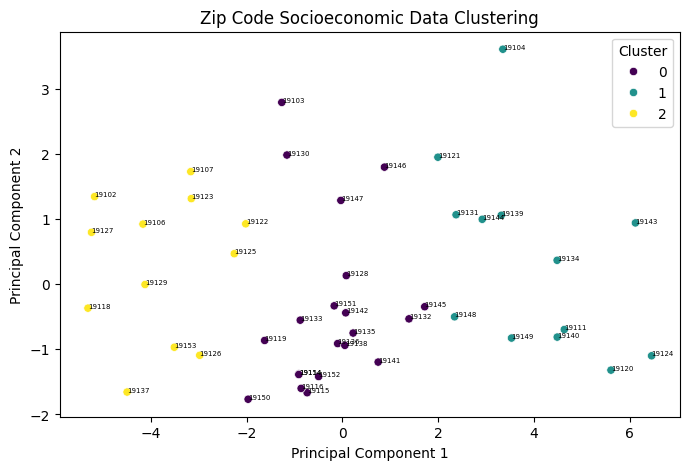

In [64]:
# Perform clustering
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit(census_reduced)

census_pca = pd.DataFrame(census_reduced, columns=['PC1', 'PC2'])
census_pca['Cluster'] = clusters.labels_
census_pca['Zip Code'] = census_eda_df.index.values

# Plot the clusters
plt.figure(figsize=(8, 5))
sns.scatterplot(data=census_pca, x='PC1', y='PC2', hue='Cluster', palette='viridis')
for i in range(census_pca.shape[0]):
    plt.text(x=census_pca.PC1[i], y=census_pca.PC2[i], s=census_pca["Zip Code"][i],
             fontdict=dict(color='black', size=5))
plt.title('Zip Code Socioeconomic Data Clustering')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.show()

## 311 & Weather EDA

In this section we look into the relationship between weather and Philly 311 tickets.

### Ticket Volumes and Weather Conditions

Here we see scatterplots to visualize ticket volume trends related to weather conditions (precipitation, temp, wind speed)

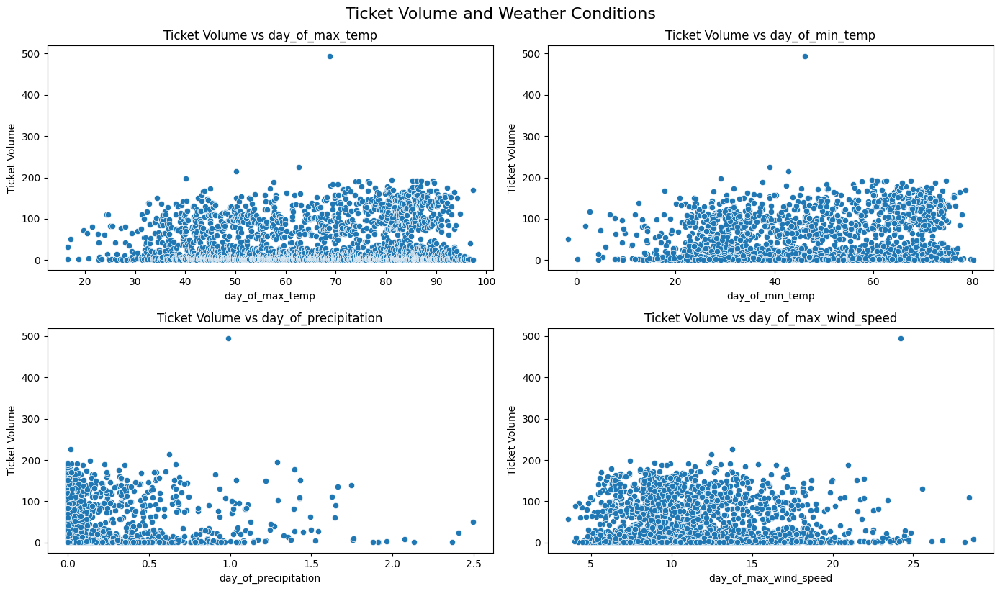

In [65]:
eda_merged_df['date'] = eda_merged_df['request_date'].dt.date

# Calculate ticket volume per weather condition
weather_columns = ['day_of_max_temp', 'day_of_min_temp', 'day_of_precipitation', 'day_of_max_wind_speed']
ticket_volume = eda_merged_df.groupby(weather_columns).size().reset_index(name='ticket_volume')

# Visualize ticket volume by weather conditions
plt.figure(figsize=(14, 8))

for i, column in enumerate(weather_columns, 1):
    plt.subplot(2, 2, i)
    sns.scatterplot(x=ticket_volume[column], y=ticket_volume['ticket_volume'])
    plt.title(f'Ticket Volume vs {column}')
    plt.xlabel(column)
    plt.ylabel('Ticket Volume')

plt.tight_layout()
plt.suptitle('Ticket Volume and Weather Conditions', fontsize=16, y=1.02)
plt.show()

#### Correlation Between Weather and Resolution Time

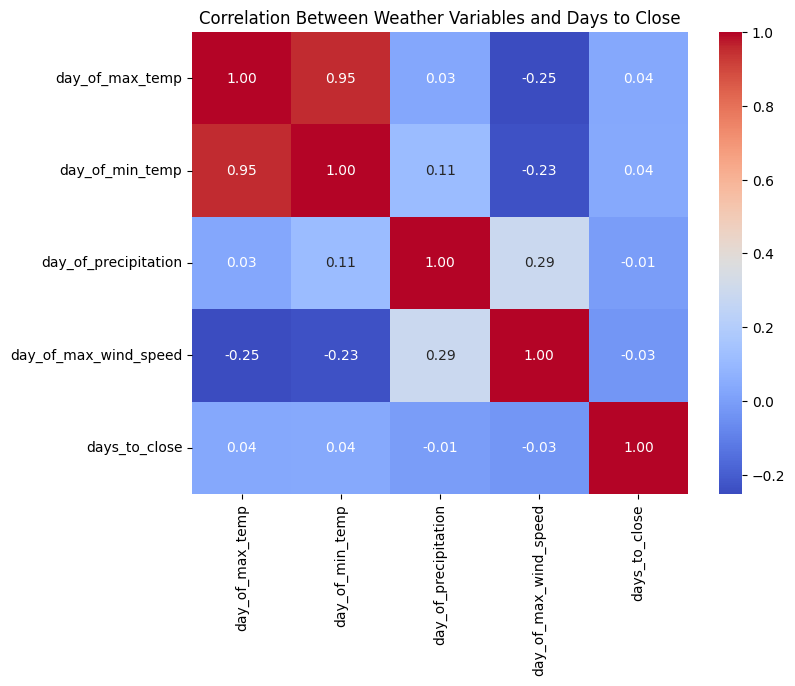

In [66]:
weather_vars = ['day_of_max_temp', 'day_of_min_temp', 'day_of_precipitation', 'day_of_max_wind_speed', 'days_to_close']

# Calculate correlation matrix
correlation_matrix = eda_merged_df[weather_vars].corr()

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Between Weather Variables and Days to Close')
plt.show()

## 311 & Census EDA

In this section we explore the relationship between the socioeconomic data we pulled from the census and trends in the 311 data, including ticket volume and resolution time trends.

### Map Visuals

#### Hotspots of Slow Resolution Times

In [67]:
zipcode_agg = philly_311_eda_sample_df.groupby(['zipcode', 'lat', 'lon']).agg({'days_to_close': 'mean'}).reset_index()

# Scatter mapbox
fig = px.scatter_mapbox(
    zipcode_agg,
    lat='lat',
    lon='lon',
    color='days_to_close',
    size='days_to_close',
    size_max=15,
    color_continuous_scale='Reds',
    title='Geographic Hotspots of Slow Resolution Times',
    labels={'days_to_close': 'Days to Close'},
    hover_name='zipcode',
    hover_data={'lat': False, 'lon': False}
)

fig.update_layout(
    mapbox_style='carto-positron',
    mapbox_zoom=12,  # Adjust zoom level
    mapbox_center={'lat': philly_311_eda_sample_df['lat'].mean(), 'lon': philly_311_eda_sample_df['lon'].mean()},
    margin={'l': 0, 'r': 0, 't': 30, 'b': 0},  # Reduce map margins
    title_x=0.5
)

fig.show()

In [68]:
geolocator = Nominatim(user_agent="zip_code_geocoder")
geocode = RateLimiter(geolocator.geocode, min_delay_seconds=1)

# Get lat and lon for census
def get_lat_lon(zip_code):
    location = geocode({"postalcode": zip_code, "country": "US"})
    if location:
        return location.latitude, location.longitude
    return None, None

In [69]:
%%capture
census_final_df[['latitude', 'longitude']] = census_final_df['zip_code'].apply(lambda z: pd.Series(get_lat_lon(z)))

#### Map of Median Household Income

In [70]:
fig = px.scatter_mapbox(
    census_final_df,
    lat='latitude',
    lon='longitude',
    color='Median Household Income',
    size='Median Household Income',
    size_max=15,
    color_continuous_scale='Blues',
    title='Median Household Income by Zip Code',
    labels={'Median Household Income': 'Median Income ($)'},
    # hover_name=zip_code,
    # hover_data={'lat': False, 'lon': False}  # Exclude lat/lon from hover data
)

fig.update_layout(
    mapbox_style='carto-positron',
    mapbox_zoom=12,  # Adjust zoom level
    mapbox_center={'lat': census_final_df['latitude'].mean(), 'lon': census_final_df['longitude'].mean()},
    margin={'l': 0, 'r': 0, 't': 30, 'b': 0},  # Reduce map margins
    title_x=0.5

)

fig.show()

### Exploring Ticket Trends by Median Household Income

#### Ticket Counts by Median Household Income

In [71]:
ticket_volumes = philly_311_eda_sample_df['zipcode'].value_counts().reset_index()
ticket_volumes.columns = ['zip_code', 'ticket_volume']

merged_df = pd.merge(ticket_volumes, census_final_df, on='zip_code')

# Histogram of ticket counts by Median Household Income
fig = px.histogram(
    merged_df,
    x='Median Household Income',
    y='ticket_volume',
    nbins=10,
    title='Histogram of Ticket Counts by Median Household Income',
    labels={'ticket_volume': 'Ticket Volume', 'Median Household Income': 'Median Household Income'},
    histfunc='sum'
)

fig.update_layout(
    xaxis_title='Median Household Income',
    yaxis_title='Total Ticket Count',
    bargap=0.2,
    title_x=0.5
)


fig.show()

#### Average Days to Close by Median Household Income

In [72]:
average_days_to_close = philly_311_eda_sample_df.groupby('zipcode')['days_to_close'].mean().reset_index()
average_days_to_close.columns = ['zip_code', 'avg_days_to_close']

merged_df = pd.merge(average_days_to_close, census_final_df, on='zip_code')

# Histogram of average days_to_close by Median Household Income
fig = px.histogram(
    merged_df,
    x='Median Household Income',
    y='avg_days_to_close',
    nbins=10,
    title='Histogram of Average Days to Close by Median Household Income',
    labels={'avg_days_to_close': 'Average Days to Close', 'Median Household Income': 'Median Household Income'},
    histfunc='avg'  # Calculate the average of days_to_close for each income bin
)

fig.update_layout(
    xaxis_title='Median Household Income',
    yaxis_title='Average Days to Close',
    title_x=0.5,
    bargap=0.2  # Adjust gap between bars
)

fig.show()

#### Ticket Volume, Population, and Median Household Income

In [73]:
ticket_volumes = philly_311_eda_sample_df['zipcode'].value_counts().reset_index()
ticket_volumes.columns = ['zip_code', 'ticket_volume']

merged_df = pd.merge(ticket_volumes, census_final_df, on='zip_code')

# CAN ADD MORE TO THE HOVER OPTION

# Ticket volumes vs. Total Population, (color = Median Household Income)
fig = px.scatter(
    merged_df,
    x='Total Population',
    y='ticket_volume',
    size='ticket_volume',
    color='Median Household Income',  # NOTE: can color by a different census feature
    hover_data=['Median Household Income', 'Vacant Housing Units Rate'],
    title='Ticket Volumes vs. Total Population (Colored by Median Household Income)',
    labels={'Total Population': 'Total Population', 'ticket_volume': 'Ticket Volume'},

)

fig.update_layout(
    title_x=0.5
)

fig.update_traces(marker=dict(line=dict(width=1, color='DarkSlateGrey')))
fig.show()

### Exploring Ticket Trends by Income Group

Income group quartiles:
* Low: \$28,287 - \$41,764
* Medium: \$41,764 - \$67,690
* High: \$67,690 - \$128,173

#### Average Resolution Time by Income Group

We can see that for all service types in aggregate, tickets requested in low-income areas take longer to resolve on average.

This may be due to differences in the service types requested by each income group, which we will explore further.

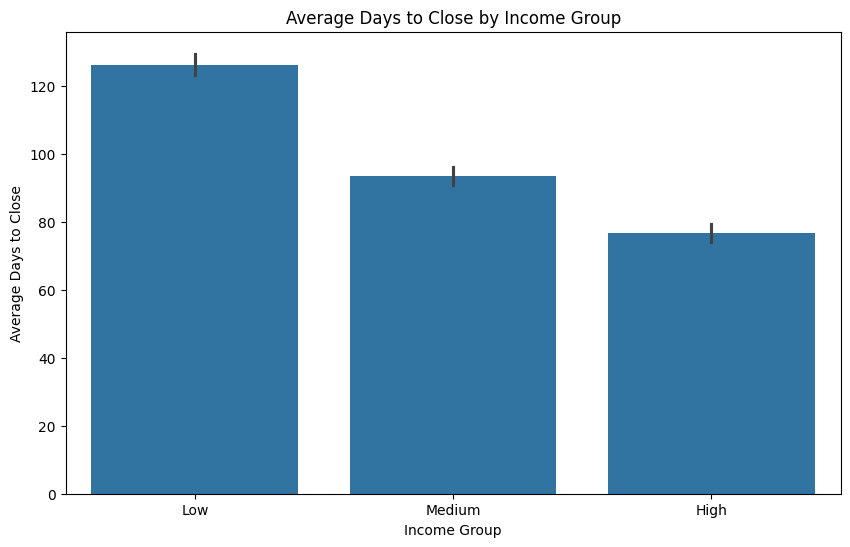

In [74]:
eda_merged_df['income_group'] = pd.qcut(eda_merged_df['Median Household Income'], q=3, labels=['Low', 'Medium', 'High'])

# Plotting average days_to_close by income group
plt.figure(figsize=(10, 6))
sns.barplot(data=eda_merged_df, x='income_group', y='days_to_close', estimator='mean')
plt.title('Average Days to Close by Income Group')
plt.xlabel('Income Group')
plt.ylabel('Average Days to Close')
plt.show()

#### Request Frequency by Income Group

Broken down by service category

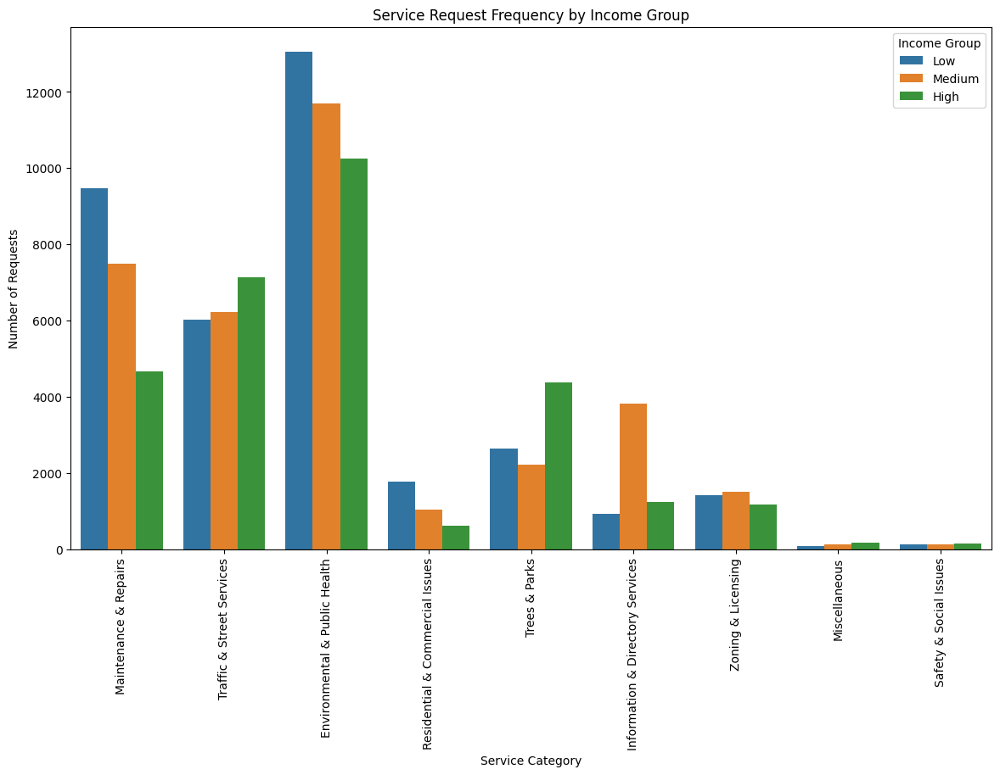

In [75]:
plt.figure(figsize=(14, 8))
sns.countplot(data=eda_merged_df, x='service_category', hue='income_group')
plt.title('Service Request Frequency by Income Group')
plt.xlabel('Service Category')
plt.ylabel('Number of Requests')
plt.xticks(rotation=90)
plt.legend(title='Income Group')
plt.show()

#### Average Resolution Time per Service Name, by Income Group

How to interpret:
* Top level boxes represent income groups
* Within each income group, we have nested boxes representing the service categories
* The inner level box size corresponds to the average `days_to_close`

We can see that some categories, such as Residential and Commercial issues or Maintenance and Repairs, have significantly longer resolution times for lower income groups while others, such as Safety and Social Issues have significantly longer resolution times for higher income groups.

In [76]:
eda_merged_df['income_group'] = pd.qcut(eda_merged_df['Median Household Income'], q=3, labels=['Low', 'Medium', 'High'])

grouped_df = eda_merged_df.groupby(['income_group', 'service_category']).agg({'days_to_close': 'mean'}).reset_index()

# Treemap
fig = px.treemap(
    grouped_df,
    path=['income_group', 'service_category'],
    values='days_to_close',
    color='service_category',  # Color by service category
    color_discrete_map={'Category 1': 'lightblue', 'Category 2': 'lightgreen'},  # Custom colors for categories
    title='Average Days to Close by Income Group and Service Category',
    labels={'days_to_close': 'Avg Days to Close'},
    height=500
)

fig.update_traces(textinfo='label+value')

fig.update_layout(
    margin={'l': 20, 'r': 20, 't': 50, 'b': 20},
    title_x=0.5
)

fig.show()

# Modeling
In this section we make the final changes to our feature dataset so that it is compatible with machine learning techniques. We need all data to be numerical or else the models won't work, so we convert all categorical variables into dummy columns that store 1 or 0. We don't want numerical features with large values to skew our models, so we scale all numeric columns using the StandardScaler from sklearn.

Because our labels (days_to_close) have a large variance, we also chose to scale them by taking the natural log of each value.

#### Collecting Data for Final Results Table

In [77]:
models = []
days_to_close_errors = []

## Preparing Merged Dataset

Creating dummy columns:

In [78]:
merged_original_df = merged_final_df.copy()

categorical_df = merged_original_df[[
  "season",
  "region",
  "service_category"
]]

categorical_dummies_df = pd.get_dummies(categorical_df, dtype=float)
categorical_dummies_df.head()

,season_fall,season_spring,season_summer,season_winter,region_CC,region_N,region_NE,region_NW,region_S,region_SW,region_W,service_category_Environmental & Public Health,service_category_Information & Directory Services,service_category_Maintenance & Repairs,service_category_Miscellaneous,service_category_Residential & Commercial Issues,service_category_Safety & Social Issues,service_category_Traffic & Street Services,service_category_Trees & Parks,service_category_Zoning & Licensing
0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


Here we scale the numeric features and the labels:

In [79]:
numeric_features = [
  "years_since_311_start",
  "Total Population",
  "Median Age",
  "Median Household Income",
  "Median Home Value",
  "Population Unemployed Rate",
  'day_of_max_temp',
  'day_of_min_temp',
  'day_of_precipitation',
  'day_of_max_wind_speed',
]

numeric_features_df = merged_original_df[numeric_features]

scaler = StandardScaler()
scaled_numeric_features = scaler.fit_transform(numeric_features_df.values)
scaled_numeric_features_df = pd.DataFrame(scaled_numeric_features, columns=numeric_features)

# log of y variable
log = lambda x: np.log(x) if x > 0 else 0
scaled_numeric_features_df['days_to_close'] = merged_original_df['days_to_close'].apply(log)

In [80]:
scaled_numeric_features_df.head()

,years_since_311_start,Total Population,Median Age,Median Household Income,Median Home Value,Population Unemployed Rate,day_of_max_temp,day_of_min_temp,day_of_precipitation,day_of_max_wind_speed,days_to_close
0,0.267219,1.111631,-0.750216,-0.800411,-0.900436,-1.736812,-1.413713,-1.076982,-0.105617,1.807475,7.159292
1,-1.451205,-1.428164,-0.316733,1.354035,1.875477,-1.080844,1.030319,1.024836,-0.499901,-0.698291,0.000000
2,0.696825,1.291494,-0.367731,-0.702360,-0.761085,0.447273,-0.950781,-0.767884,-0.499901,-0.829694,4.369448
3,1.556037,0.130992,0.983715,0.399084,0.208447,0.275066,-1.498335,-1.231531,-0.039903,-1.005676,0.693147
4,0.267219,1.788687,-0.087242,-0.504717,-0.776651,0.131809,1.184680,1.091859,-0.499901,-0.670198,2.772589


In [81]:
# combined df to put into models
merged_scaled_dummies_df = pd.concat([scaled_numeric_features_df, categorical_dummies_df], axis=1)
merged_scaled_dummies_df.dropna(inplace=True)

In [82]:
merged_scaled_dummies_df.head()

,years_since_311_start,Total Population,Median Age,Median Household Income,Median Home Value,Population Unemployed Rate,day_of_max_temp,day_of_min_temp,day_of_precipitation,day_of_max_wind_speed,...,region_W,service_category_Environmental & Public Health,service_category_Information & Directory Services,service_category_Maintenance & Repairs,service_category_Miscellaneous,service_category_Residential & Commercial Issues,service_category_Safety & Social Issues,service_category_Traffic & Street Services,service_category_Trees & Parks,service_category_Zoning & Licensing
0,0.267219,1.111631,-0.750216,-0.800411,-0.900436,-1.736812,-1.413713,-1.076982,-0.105617,1.807475,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,-1.451205,-1.428164,-0.316733,1.354035,1.875477,-1.080844,1.030319,1.024836,-0.499901,-0.698291,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,0.696825,1.291494,-0.367731,-0.702360,-0.761085,0.447273,-0.950781,-0.767884,-0.499901,-0.829694,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.556037,0.130992,0.983715,0.399084,0.208447,0.275066,-1.498335,-1.231531,-0.039903,-1.005676,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.267219,1.788687,-0.087242,-0.504717,-0.776651,0.131809,1.184680,1.091859,-0.499901,-0.670198,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [83]:
merged_scaled_dummies_df.describe().days_to_close

,days_to_close
count,99990.000000
mean,2.549810
std,2.025327
min,0.000000
25%,0.693147
50%,2.079442
75%,4.143135
max,7.948385


In [84]:
# for consistency
random_state = 42

## Linear Models

### Linear Regression

In [85]:
# getting data for linear regression
lin_reg_data = merged_scaled_dummies_df.copy()
y = lin_reg_data['days_to_close']
X = lin_reg_data.drop('days_to_close', axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=random_state)

In [86]:
# fit
lin_reg = LinearRegression().fit(X_train, y_train)

# predict
y_pred = lin_reg.predict(X_test)

# evaluate
mse_score = mean_squared_error(y_test, y_pred)
print(f"MSE score: {mse_score}")

error_days = (np.exp(mse_score))**(1/2)
print(f"Average error in days to close: {error_days}")

# bookkeeping
models.append("Linear Regression")
days_to_close_errors.append(error_days)

MSE score: 2.9594063928787193
Average error in days to close: 4.391642032472281


#### Linear Regression Results

#### What features matter? Ranking coefficients

In [87]:
cols = merged_scaled_dummies_df.columns.values.tolist()
cols.remove("days_to_close")
lin_reg_coeffs = pd.DataFrame({"Feature": cols,
                               "Coefficents": lin_reg.coef_})
lin_reg_coeffs.sort_values(by="Coefficents", ascending=False, inplace=True)
lin_reg_coeffs

,Feature,Coefficents
25,service_category_Residential & Commercial Issues,1.909061
23,service_category_Maintenance & Repairs,1.734428
29,service_category_Zoning & Licensing,0.608303
19,region_SW,0.247327
0,years_since_311_start,0.140982
3,Median Household Income,0.140152
20,region_W,0.099174
17,region_NW,0.069049
15,region_N,0.067318
6,day_of_max_temp,0.062857


#### Can we get more specific? Error time by category

In [88]:
service_cols = [col for col in merged_scaled_dummies_df.columns if "service_category" in col]
idxs = [col[17:] for col in service_cols]
std_devs = []
errors = []

for cat in service_cols:
  # df of only that service category
  cat_df = merged_scaled_dummies_df[merged_scaled_dummies_df[cat] == 1]
  std_devs.append(np.exp(np.var(cat_df.days_to_close.values))**(1/2))
  X_train, X_test, y_train, y_test = train_test_split(
                          cat_df.drop("days_to_close", axis=1),
                          cat_df["days_to_close"], test_size=0.2, random_state=random_state)
  # fit
  lin_reg = LinearRegression().fit(X_train, y_train)
  # predict
  y_pred = lin_reg.predict(X_test)
  # evaluate
  mse_score = mean_squared_error(y_test, y_pred)
  errors.append(np.exp(mse_score)**(1/2))

In [89]:
errors_by_cat_df = pd.DataFrame({"Service Category": idxs,
              "Mean Error (days)": errors, "Underlying Variance": std_devs})

errors_by_cat_df = errors_by_cat_df.sort_values(by='Mean Error (days)',
                    ascending=False)

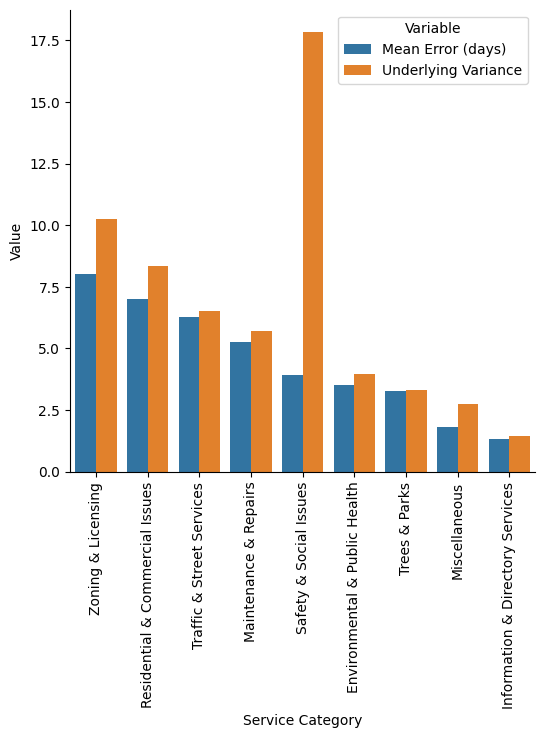

In [90]:
fig, ax1 = plt.subplots(figsize=(6, 6))
tidy = errors_by_cat_df.melt(id_vars='Service Category').rename(columns=str.title)
sns.barplot(x='Service Category', y='Value', hue='Variable', data=tidy, ax=ax1)
sns.despine(fig)
plt.xticks(rotation=90)
plt.show()

### Linear Regression Coefficients

The coefficients with the highest absolute value are those referring to the `service_category`. This suggests that the main feature impacting `days_to_close` in either direction is the service category. Taking a closer look at the errors, when we break the error down by training a linear regressor one category at at time, the average model error mostly follows the underlying variance for that category.

The features from the Census dataset regarding economic status of the zip code, as well as Weather data from the day of the call are closer to zero.

We can continue to explore feature importances further with Lasso Regularization.

### Lasso Regularization

In [91]:
# fit
lasso_cv = LassoCV().fit(X_train, y_train)

# predict
y_pred = lasso_cv.predict(X_test)

# evaluate
mse_score = mean_squared_error(y_test, y_pred)
print(f"MSE score: {mse_score}")

error_days = (np.exp(mse_score))**(1/2)
print(f"Average error in days to close: {error_days}")

# bookkeeping
models.append("Lasso Regularization")
days_to_close_errors.append(error_days)

MSE score: 4.178961930198362
Average error in days to close: 8.080719900003103


In [92]:
lasso_coeffs = pd.DataFrame({"Feature": cols,
                               "Coefficents": lasso_cv.coef_})
lasso_coeffs.sort_values(by="Coefficents", ascending=False, inplace=True)
lasso_coeffs

,Feature,Coefficents
15,region_N,0.141047
7,day_of_min_temp,0.125983
6,day_of_max_temp,0.060048
5,Population Unemployed Rate,0.000000
1,Total Population,0.000000
3,Median Household Income,-0.000000
12,season_summer,0.000000
13,season_winter,-0.000000
11,season_spring,0.000000
10,season_fall,-0.000000


#### Lasso Coefficients

The Lasso model uses Cross Validation to find an ideal alpha value of around 0.02. In the best-performing model, only 8 of the features remain. While the features that remain are not similar to the Linear Regression model, the error for this model is almost twice as high.

## Ensemble Models

The following ensemble methods are meant to test if other models can produce better results than linear regression. In the following tests, all three methods perform far worse than linear regression.

For each method we continue to record our results for a final comparison of all models.

### Random Forest Regression

In [93]:
# fit (takes about 1m 30s)
reg_rf = RandomForestRegressor(random_state=random_state).fit(X_train, y_train)

# predict
y_pred = reg_rf.predict(X_test)

# evaluate
mse_score = mean_squared_error(y_test, y_pred)
print(f"MSE score: {mse_score}")

error_days = (np.exp(mse_score))**(1/2)
print(f"Average error in days to close: {error_days}")

# bookkeeping
models.append("Random Forest Regression")
days_to_close_errors.append(error_days)

MSE score: 4.549279997147715
Average error in days to close: 9.724417578140471


### Random Forest Regression with Bagging

In [94]:
# fit (takes about 1m 30s)
rf = RandomForestRegressor()
rf_bag = BaggingRegressor(estimator=rf).fit(X_train, y_train)

# predict
y_pred = rf_bag.predict(X_test)

# evaluate
mse_score = mean_squared_error(y_test, y_pred)
print(f"MSE score: {mse_score}")

error_days = (np.exp(mse_score))**(1/2)
print(f"Average error in days to close: {error_days}")

# bookkeeping
models.append("Random Forest Bagging")
days_to_close_errors.append(error_days)

MSE score: 4.297564990697438
Average error in days to close: 8.57441265231055


### Gradient Boosting Regressor

In [95]:
# fit (takes about 1m 30s)
gb_reg = GradientBoostingRegressor().fit(X_train, y_train)

# predict
y_pred = gb_reg.predict(X_test)

# evaluate
mse_score = mean_squared_error(y_test, y_pred)
print(f"MSE score: {mse_score}")

error_days = (np.exp(mse_score))**(1/2)
print(f"Average error in days to close: {error_days}")

# bookkeeping
models.append("Gradient Boosting Regression")
days_to_close_errors.append(error_days)

MSE score: 4.096716848998221
Average error in days to close: 7.75515997078649


## Feed Forward Neural Network  

We attempted to fit a feedforward neural network to the data to see if it could do a better job of detecting trends than regression. Unfortunately we could not get the model to train properly - depsite trying many different configurations of layers, adding different types of layers like dropout and batch normalization, and varying the features used in our training data. The resulting NN only worked slightly better than just predicting the mean of the labels. Because we were able to find a trend in linear regression, we believe that the NN should be able to detect something, so there is likely something wrong with our setup. Given more time, this is an area we would like to explore further.

Here is the code we used despite the lack of results.

In [96]:
device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)

In [97]:
nn_df = merged_scaled_dummies_df.copy()

In [98]:
y = nn_df['days_to_close']
X = nn_df.drop('days_to_close', axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [99]:
class CustomDataset(Dataset):
    def __init__(self, features, labels):
        self.features = features.values
        self.labels = labels.values

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        features = torch.tensor(self.features[idx], dtype=torch.float32)
        label = torch.tensor(self.labels[idx], dtype=torch.float32)
        return features, label

# Create dataset and dataloader
dataset = CustomDataset(X_train, y_train)
dataloader = DataLoader(dataset, batch_size=100, shuffle=True)

In [100]:
class my_NN(nn.Module):
    def __init__(self):
        super().__init__()

        self.flatten = nn.Flatten()
        self.input = nn.Linear(30,512)
        self.hidden = nn.Linear(512,512)
        self.hidden2 = nn.Linear(512, 512)
        self.output = nn.Linear(512,1)
        self.batch_norm1 = nn.BatchNorm1d(512)
        self.batch_norm2 = nn.BatchNorm1d(512)
        self.relu = nn.ReLU()

    def forward(self, x):
        outputs = nn.Sequential(self.flatten, self.input, self.batch_norm1, self.relu, self.hidden, self.batch_norm2, self.relu, self.hidden2, self.relu, self.output)(x)
        return outputs

Training Loop Adapted from HW5

In [101]:

my_nn = my_NN()
my_nn = my_nn.to(device)

criterion = nn.MSELoss()

# Optimizer - same as class
optimizer = optim.Adam(my_nn.parameters(), lr=0.001) #lr - learning step
epoch = 10
loss_LIST_NN = []

for epoch in range(epoch):
  running_loss = 0.0
  correct = 0
  total = 0
  all_outputs = np.array([])
  all_labels = np.array([])
  for inputs,labels in dataloader:
    inputs, labels = inputs.to(device), labels.to(device)
    optimizer.zero_grad()
    outputs = my_nn(inputs)
    outputs_tmp = outputs.detach().cpu()
    labels_tmp = labels.detach().cpu()
    all_outputs = np.append(all_outputs,outputs_tmp.numpy())
    all_labels = np.append(all_labels,labels_tmp.numpy())
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    running_loss += loss.item()

  loss_LIST_NN.append(running_loss/len(dataloader))

  print("The loss for Epoch {} is: {}".format(epoch, running_loss/len(dataloader)))

The loss for Epoch 0 is: 4.1692233392596245
The loss for Epoch 1 is: 4.139491748511791
The loss for Epoch 2 is: 4.128200964331627
The loss for Epoch 3 is: 4.12749657034874
The loss for Epoch 4 is: 4.126984498500824
The loss for Epoch 5 is: 4.118795099556446
The loss for Epoch 6 is: 4.120963178277016
The loss for Epoch 7 is: 4.1147195646166805
The loss for Epoch 8 is: 4.115088309347629
The loss for Epoch 9 is: 4.113518235087395


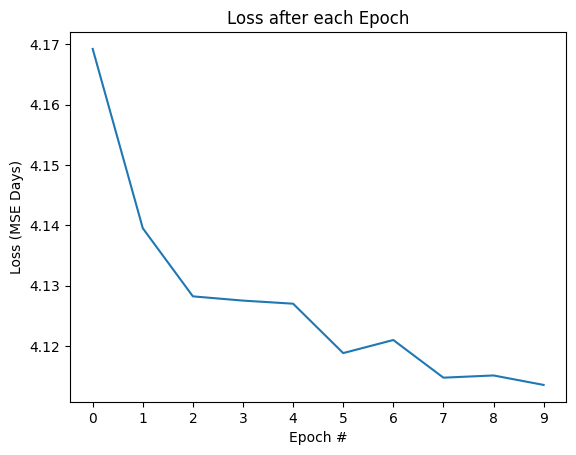

In [102]:
epochs = [i for i in range(10)]
fig,ax = plt.subplots()
plt.plot(epochs, loss_LIST_NN)
plt.title("Loss after each Epoch")
plt.xticks(ticks = epochs, labels = epochs)
plt.xlabel("Epoch #")
plt.ylabel("Loss (MSE Days)")
plt.show()

In [103]:
#evaluation
test_dataset = CustomDataset(X_test, y_test)
test_dataloader = DataLoader(dataset, batch_size=100, shuffle=True)
all_preds = np.array([])
all_labels = np.array([])
for inputs,labels in test_dataloader:
  inputs, labels = inputs.to(device), labels.to(device)
  preds = my_nn(inputs)
  preds_tmp = preds.detach().cpu()
  labels_tmp = labels.detach().cpu()
  all_preds = np.append(all_preds,preds_tmp.numpy())
  all_labels = np.append(all_labels,labels_tmp.numpy())




In [104]:
# evaluate
mse_score = mean_squared_error(all_labels, all_preds)
print(f"MSE score: {mse_score}")

error_days = (np.exp(mse_score))**(1/2)
print(f"Average error in days to close: {error_days}")

# bookkeeping
models.append("Feedforward NN")
days_to_close_errors.append(error_days)

MSE score: 4.097485116428312
Average error in days to close: 7.758139561440816


# Results

## Baseline: predict the mean

In [105]:
# for comparing
mean = y_test.mean()
pred_mean = [mean for i in y_test]

# evaluate
mse_score = mean_squared_error(y_test, pred_mean)
print(f"MSE score: {mse_score}")

error_days = (np.exp(mse_score))**(1/2)
print(f"Average error in days to close: {error_days}")

# bookkeeping
models.append("Predict the Mean")
days_to_close_errors.append(error_days)

MSE score: 4.068093677986431
Average error in days to close: 7.644961772130768


## Results Table

In [106]:
results = pd.DataFrame({"Model": models, "Error in Days": days_to_close_errors})
results.sort_values(by="Error in Days", inplace=True)
results.set_index('Model', inplace=True)

results

,Error in Days
Model,
Linear Regression,4.391642
Predict the Mean,7.644962
Gradient Boosting Regression,7.755160
Feedforward NN,7.758140
Lasso Regularization,8.080720
Random Forest Bagging,8.574413
Random Forest Regression,9.724418


### Discussion

#### Error in Days Metrics

The idea behind the "Error in Days" metric comes taking the mean squared error of the each model. Since each model is in log form, we exponentiate to get the units in days squared, and finally the square root of that value. With a perfect model, a caller should be able to make a 311 call and get a very accurate estimate of how long their request should take to complete.

#### Predict the Mean

We include the "Predict the Mean" model as a very efficient baseline model to understand what should be the upper bound for the number of days off. Surprisingly, this estimate performs better than many of the models.

#### Best Performer

The simple but mighty linear regression model performed far better than every other model. It cut down the error of predicting the mean by almost 50%. For this model the `service_category` was the most impactful feature, as it's dummies were the top 6 highest absolute weight values. The lassoCV model interestingly did not include the services as high weights, and performed almost twice as poorly on the test data.

#### Ensemble Methods

The Random Forest Regressor performed surprisingly poorly without any adjustments, as it was almost 10 days off on average. Bagging brought down this error rate, and the Gradient Boosting method brought it down slightly more. However, these improvements were only on par with predicting the mean value for each, making them bad models when considering their complexity.

#### Neural Net

As discussed above, we attempted to fit a neural network to the data but had issues with underfitting, so we did not come up with a neural model that performed well.

# Conclusion


## Takeaways from EDA and Modeling

- Overall, we did not find any strong relationship between socioeconomic data and 311 ticket resolution time from this data. We attribute this in large part to the unstructured nature of the data - there are many different services, all with vastly different responsibilities, grouped under 311, which makes it tough to draw specific conclusions.

- **Model Takeaways:**
In our modeling section, we tried to engineer features so that we could test the relationship between economic status and days to close. However, in our best model (linear regression), the features with highest absolute weights ended up being service categories, and socio-economic indicators had low absolute value weights. Because of this, we were not able to claim that economic factors of the caller's ZIP code had a significant impact on accurately predicting days to close.

  This result could indicate a positive normative result for the 311 hotline, suggesting that it distributes resources equally across ZIP codes. However, our models were not perfect, and they could still be missing relationships that are in the underlying data. See our further directions for more on where our analysis can continue.

- **EDA Takeaways:**
While our modeling did not indicate socioeconomic status as a strong predictor of resolution time, by exploring our datasets via EDA, we identified that there were some noticeable differences in resolution times between income groups that could warrant future investigation. Average ticket resolution time for lower income groups was higher on average, which may be explained by the differences in the types of tickets requested. Even within any given `service_type` there may be variations in the request specifics that could impact resolution time. Further analysis is required to better understand the relationship between resolution time and socioeconomic status to determine whether these differences are significant, and if necessary, what steps to take to ensure that the 311 service is equitable for all residents in Philadelphia.


## Challenges



* One of the biggest challenges was the 311 dataset itself. While the census and weather data were standardized and numeric, the 311 data was much less structured. There is no clear methodology for how call center workers input a call's data, so there were many tickets with null fields. There were also service names and agencies with names that were similar but differed by the use of stopwords (of, the) or the use of parentheses, making direct comparison between these categories more difficult. Finally, the number of categorical variables meant that we had to create many dummy features.

*   The intricacies in the dataset could be better understood and explained with additional domain knowledge. Without domain knowledge and additional context, it was challenging to interpret trends, specifically the drastic peaks and valleys in ticket volumes over time. For example, there may have been disruptions in service that provide a clear explanation of what we saw in the dataset, such as the periods of low ticket volume in 2017-2018 and 2023-2024. Additionally, it may be helpful to understand any differences in data recording practices between different agencies and whether processes changed over time and how this might have affected the trends.

* We hoped to make use of modern NLP tools to draw trends based on the "subject" of the 311 ticket, but were unable to get any useful results. We converted the subject to a vector representation with `BERT` and attempted to use that representation to cluster tickets based on similar themes, but did not get results that seemed useful when we reviewed the clusters. Upon digging further, we realized that many of the subjects did not appear to be free-text, but rather categories (e.g., "Graffiti Removal"), so we weren't able to extract much meaning from the vector representations. We also tried fitting a neural net using the vectors as the only features and resolution time as the label, but again did not see useful results. Ultimately, it does not seem like there is enough variation in the text data in tickets for NLP tools to provide extra insights into this data.

## Future Directions

* To get the most insight from the data, it would be helpful to obtain the perspective and domain knowledge of a 311 administrator. With this person's expertise, we could better understand the factors that go into entering a caller's information, and understanding these practices would inform feature extraction. With better features, we could choose the type of model more precisely, and improve the model's accuracy.

* We might also consider exploring additional ways to leverage our datasets to provide further insights, such as exploring ticket volumes. This might include a more thorough analysis of weather data to identify if weather events drive ticket volumes. Having the ability to predict or forecast future ticket volumes could prove beneficial for planning and resource allocation for city agencies.

* Using the results: while we didn't find any major actionable trends yet, we could create an online dashboard for 311 that tracks ticket resolution time along with metadata so administrators can see what is happening in their departments and improve service accordingly. In addition to helping improve resolution time, better visibility into the dataset could help administrators notice issues in data entry. For example, they may find that certain fields are commonly left blank on tickets assigned to certain departments, prompting them to remove that field, or they may find that they need a piece of information that is not currently captured in the data, prompting them to add it.

* While we did not remove outliers in this analysis, this is one consideration that may be worth exploring in future analyses. Additionally, we might consider analyzing resolution time on a more granular level (by service name instead of service category).

# References



**Philly 311 Dataset:** [opendataphilly.org](https://opendataphilly.org/datasets/311-service-and-information-requests/)

**Census Dataset:** [census.gov](https://www.census.gov/data/developers/data-sets.html)


**Weather Dataset:** [open-meteo.com](https://open-meteo.com/)